## Business case

<justify>No-Churn Telecom is an established Telecom operator in Europe with more than a decade in Business. Due to new players in the market, the telecom industry has become very competitive, and retaining customers is becoming a challenge. 
In spite of No-Churn's initiatives of reducing tariffs and promoting more offers, the churn rate (percentage of customers migrating to competitors) is well above 10%. No-Churn wants to explore the possibility of Machine Learning to help with the following use cases to retain a competitive edge in the industry:</justify>

## Domain Analysis

The dataset comprises of a total of 21 columns and 4617 rows

1. **State**: The state in the USA to which the account belongs.
2. **Account Length**: The number of days the customer has been with the dedicated brand.
3. **Area Code**: The area code where the customer resides.
4. **Phone**: A unique identifier for the customer.
5. **International Plan**: Indicates whether the customer has an international plan or not.
6. **VMail Plan**: Indicates whether the customer has a voice mail plan.
7. **VMail Message**: The number of voice mail inbox messages the customer has.
8. **Day Mins**: The total number of daytime minutes the customer has used.
9. **Day Calls**: The number of calls the customer made during the day.
10. **Day Charge**: The total expenses incurred by the customer for daytime usage.
11. **Eve Mins**: The total number of evening minutes the customer has used.
12. **Eve Calls**: The number of calls the customer made during the evening.
13. **Eve Charge**: The total expenses incurred by the customer for evening usage.
14. **Night Mins**: The total number of nighttime minutes the customer has used.
15. **Night Calls**: The number of calls the customer made during the night.
16. **Night Charge**: The total expenses incurred by the customer for nighttime usage.
17. **International Mins**: The total number of international minutes the customer has used.
18. **International Calls**: The number of international calls the customer made.
19. **International Charge**: The total expenses incurred by the customer for international usage.
20. **CustServ Calls**: The number of calls made by the customer to customer service.
21. **Churn**: It likely indicates whether the customer has churned (cancelled their service) or not.

In [1]:
import mysql.connector
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings 
warnings.filterwarnings('ignore')

#### Loading the dataset through SQL

In [2]:
db = mysql.connector.connect(host = '18.136.157.135',
                            user = 'dm_team3',
                            password = 'DM!$!Team!27@9!20&',
                            database = 'project_telecom')

In [3]:
table = pd.read_sql_query('show tables',db)
print(table)

  Tables_in_project_telecom
0        telecom_churn_data


In [4]:
table_name = 'telecom_churn_data'
table_details = pd.read_sql_query(f'DESCRIBE {table_name}', db)
print(table_details)

        Field          Type Null Key Default Extra
0    columns1  varchar(555)  YES        None      
1    columns2  varchar(555)  YES        None      
2    columns3  varchar(555)  YES        None      
3    columns4  varchar(555)  YES        None      
4    columns5  varchar(555)  YES        None      
5    columns6  varchar(555)  YES        None      
6    columns7  varchar(555)  YES        None      
7    columns8  varchar(555)  YES        None      
8    columns9  varchar(555)  YES        None      
9   columns10  varchar(555)  YES        None      
10  columns11  varchar(555)  YES        None      
11  columns12  varchar(555)  YES        None      
12  columns13  varchar(555)  YES        None      
13  columns14  varchar(555)  YES        None      
14  columns15  varchar(555)  YES        None      
15  columns16  varchar(555)  YES        None      
16  columns17  varchar(555)  YES        None      
17  columns18  varchar(555)  YES        None      
18  columns19  varchar(555)  YE

In [5]:
query = 'select * from telecom_churn_data'
churn_data = pd.read_sql(query, db)
churn_data

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [6]:
churn_data.rename(columns={'columns1':'state','columns2':'account_length',
                          'columns3':'area_code','columns4':'phone','columns5':'international_plan',
                          'columns6':'vmail_plan','columns7':'vmail_message','columns8':'day_mins',
                          'columns9':'day_calls','columns10':'day_charge','columns11':'eve_mins',
                          'columns12':'eve_calls','columns13':'eve_charge','columns14':'night_mins',
                          'columns15':'night_calls','columns16':'night_charge','columns17':'international_mins',
                          'columns18':'international_calls','columns19':'international_charge','columns20':'custserv_calls',
                          'columns21':'churn'}, inplace=True)

In [7]:
churn_data

,state,account_length,area_code,phone,international_plan,vmail_plan,vmail_message,day_mins,day_calls,day_charge,...,eve_calls,eve_charge,night_mins,night_calls,night_charge,international_mins,international_calls,international_charge,custserv_calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


#### Inference 
1. the total number of rows are 4616 and columns of 21 including the final target. 
2. the column names were unnamed properly, and it has been converted accordingly 

In [8]:
churn_data.columns

Index(['state', 'account_length', 'area_code', 'phone', 'international_plan',
       'vmail_plan', 'vmail_message', 'day_mins', 'day_calls', 'day_charge',
       'eve_mins', 'eve_calls', 'eve_charge', 'night_mins', 'night_calls',
       'night_charge', 'international_mins', 'international_calls',
       'international_charge', 'custserv_calls', 'churn'],
      dtype='object')

In [9]:
churn_data.describe()

,state,account_length,area_code,phone,international_plan,vmail_plan,vmail_message,day_mins,day_calls,day_charge,...,eve_calls,eve_charge,night_mins,night_calls,night_charge,international_mins,international_calls,international_charge,custserv_calls,churn
count,4617,4617,4617,4617,4617,4617,4617,4617,4617,4617,...,4617,4617,4617,4617,4617,4617,4617,4617,4617,4617
unique,51,218,3,4617,2,2,47,1901,123,1901,...,125,1621,1813,130,1012,168,21,168,10,2
top,WV,90,415,382-4657,no,no,0,154,102,26.18,...,105,14.25,194.3,105,9.66,9.8,3,2.65,1,False.
freq,149,63,2299,1,4171,3381,3381,10,108,10,...,111,15,10,115,19,81,925,81,1651,3961


In [10]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   state                 4617 non-null   object
 1   account_length        4617 non-null   object
 2   area_code             4617 non-null   object
 3   phone                 4617 non-null   object
 4   international_plan    4617 non-null   object
 5   vmail_plan            4617 non-null   object
 6   vmail_message         4617 non-null   object
 7   day_mins              4617 non-null   object
 8   day_calls             4617 non-null   object
 9   day_charge            4617 non-null   object
 10  eve_mins              4617 non-null   object
 11  eve_calls             4617 non-null   object
 12  eve_charge            4617 non-null   object
 13  night_mins            4617 non-null   object
 14  night_calls           4617 non-null   object
 15  night_charge          4617 non-null   

#### inference
1. certain data supposed to be in interger and float type. in the 
2. next step we convert the specified columns into their respective type

In [11]:
object_to_integer = ['account_length', 'area_code', 'vmail_message','day_calls',
                    'eve_calls','night_calls','international_calls','custserv_calls']

for column in object_to_integer:
    churn_data[column] = pd.to_numeric(churn_data[column], errors='coerce', downcast='integer')

In [12]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   state                 4617 non-null   object
 1   account_length        4617 non-null   int16 
 2   area_code             4617 non-null   int16 
 3   phone                 4617 non-null   object
 4   international_plan    4617 non-null   object
 5   vmail_plan            4617 non-null   object
 6   vmail_message         4617 non-null   int8  
 7   day_mins              4617 non-null   object
 8   day_calls             4617 non-null   int16 
 9   day_charge            4617 non-null   object
 10  eve_mins              4617 non-null   object
 11  eve_calls             4617 non-null   int16 
 12  eve_charge            4617 non-null   object
 13  night_mins            4617 non-null   object
 14  night_calls           4617 non-null   int16 
 15  night_charge          4617 non-null   

In [13]:
object_to_float = ['day_mins', 'day_charge', 'eve_mins','eve_charge','night_mins',
                  'night_charge','international_mins','international_charge']

for column in object_to_float:
    churn_data[column] = pd.to_numeric(churn_data[column], errors='coerce')


In [14]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   state                 4617 non-null   object 
 1   account_length        4617 non-null   int16  
 2   area_code             4617 non-null   int16  
 3   phone                 4617 non-null   object 
 4   international_plan    4617 non-null   object 
 5   vmail_plan            4617 non-null   object 
 6   vmail_message         4617 non-null   int8   
 7   day_mins              4617 non-null   float64
 8   day_calls             4617 non-null   int16  
 9   day_charge            4617 non-null   float64
 10  eve_mins              4617 non-null   float64
 11  eve_calls             4617 non-null   int16  
 12  eve_charge            4617 non-null   float64
 13  night_mins            4617 non-null   float64
 14  night_calls           4617 non-null   int16  
 15  night_charge         

In [15]:
churn_data.duplicated().sum()

0

In [16]:
churn_data.describe()

,account_length,area_code,vmail_message,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,international_mins,international_calls,international_charge,custserv_calls
count,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000
mean,100.645224,437.046350,7.849903,180.447152,100.054364,30.676576,200.429088,100.179770,17.036703,200.623933,99.944120,9.028185,10.279294,4.433831,2.775926,1.567035
std,39.597194,42.288212,13.592333,53.983540,19.883027,9.177145,50.557001,19.821314,4.297332,50.543616,19.935053,2.274488,2.757361,2.457615,0.744413,1.307019
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,12.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,165.900000,87.000000,14.100000,167.100000,87.000000,7.520000,8.600000,3.000000,2.320000,1.000000
50%,100.000000,415.000000,0.000000,180.000000,100.000000,30.600000,200.800000,101.000000,17.070000,200.800000,100.000000,9.040000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,17.000000,216.800000,113.000000,36.860000,234.000000,114.000000,19.890000,234.900000,113.000000,10.570000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [17]:
churn_data.isnull().sum()

state                   0
account_length          0
area_code               0
phone                   0
international_plan      0
vmail_plan              0
vmail_message           0
day_mins                0
day_calls               0
day_charge              0
eve_mins                0
eve_calls               0
eve_charge              0
night_mins              0
night_calls             0
night_charge            0
international_mins      0
international_calls     0
international_charge    0
custserv_calls          0
churn                   0
dtype: int64

In [18]:
state_churn = churn_data.groupby('state')['churn'].value_counts().unstack().fillna(0)

#state_churn['total_count'] = state_churn['True.'] + state_churn['False.']
#state_churn = state_churn.sort_values(by='total_count', ascending=True)
state_churn

churn,False.,True.
state,,
AK,64,5
AL,104,10
AR,62,15
AZ,74,7
CA,31,13
CO,81,10
CT,78,14
DC,73,9
DE,75,14


### Data Visualization

In [19]:
churn_data.state.value_counts()

state
WV    149
AL    114
MN    112
OH    110
ID    110
VA    109
NY    109
OR    107
NJ    106
WY    106
TX    105
UT    104
WI     99
MI     98
MA     97
KS     96
VT     95
ME     95
CT     92
MD     92
MT     92
MS     91
NH     91
CO     91
KY     90
RI     90
NV     89
IN     89
DE     89
WA     89
FL     85
NM     84
MO     84
SC     83
NC     83
TN     83
DC     82
AZ     81
ND     80
OK     80
HI     79
NE     79
IL     79
AR     77
GA     77
SD     76
LA     73
AK     69
PA     68
IA     65
CA     44
Name: count, dtype: int64

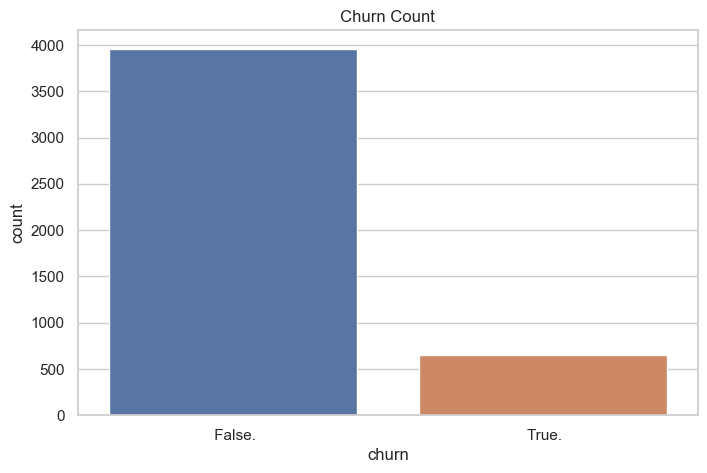

In [20]:
sns.set(style="whitegrid")
plt.figure(figsize=(8, 5))
sns.countplot(data=churn_data, x="churn")
plt.title("Churn Count")
plt.show()

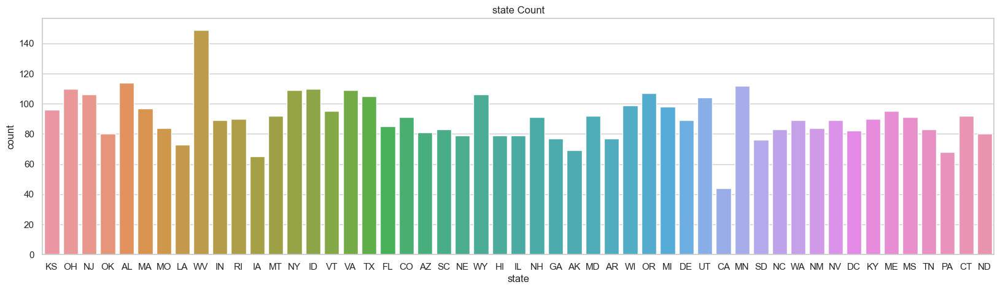

In [21]:
plt.figure(figsize=(20, 5))
sns.countplot(data=churn_data, x="state")
plt.title("state Count")
plt.show()

<Axes: xlabel='custserv_calls', ylabel='count'>

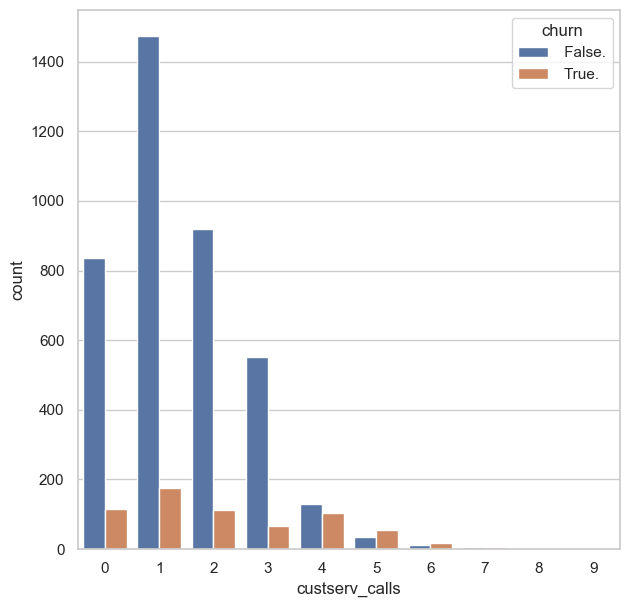

In [22]:
plt.figure(figsize=(7,7))

sns.countplot(x="custserv_calls", hue="churn", data=churn_data)

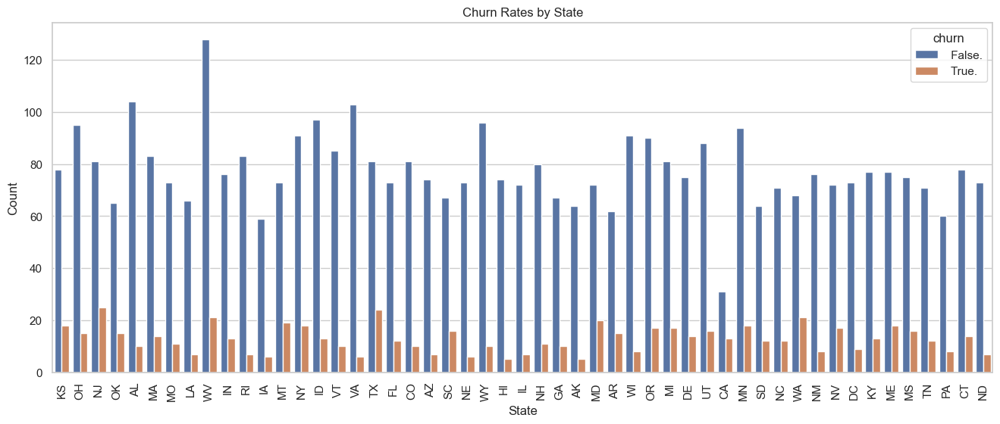

In [23]:
plt.figure(figsize=(16, 6))
sns.countplot(data=churn_data, x='state', hue='churn')
plt.title('Churn Rates by State')
plt.xlabel('State')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

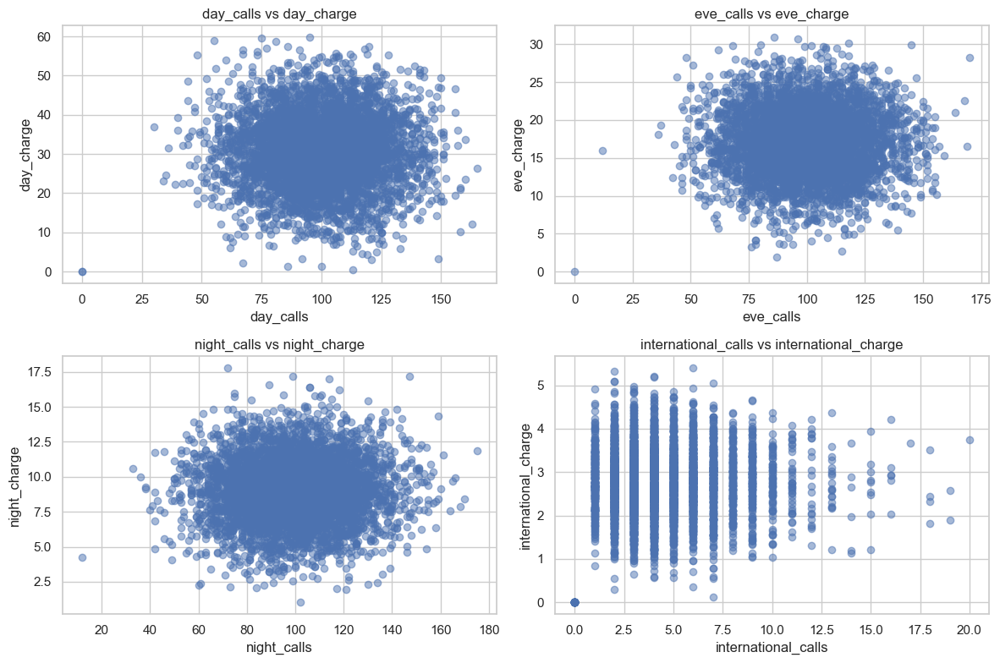

In [24]:
calls_columns = ['day_calls', 'eve_calls', 'night_calls', 'international_calls']
charge_columns = ['day_charge', 'eve_charge', 'night_charge', 'international_charge']


plt.figure(figsize=(12, 8))
for i in range(len(calls_columns)):
    plt.subplot(2, 2, i+1)
    plt.scatter(churn_data[calls_columns[i]], churn_data[charge_columns[i]], alpha=0.5)
    plt.title(f'{calls_columns[i]} vs {charge_columns[i]}')
    plt.xlabel(calls_columns[i])
    plt.ylabel(charge_columns[i])

plt.tight_layout()
plt.show()

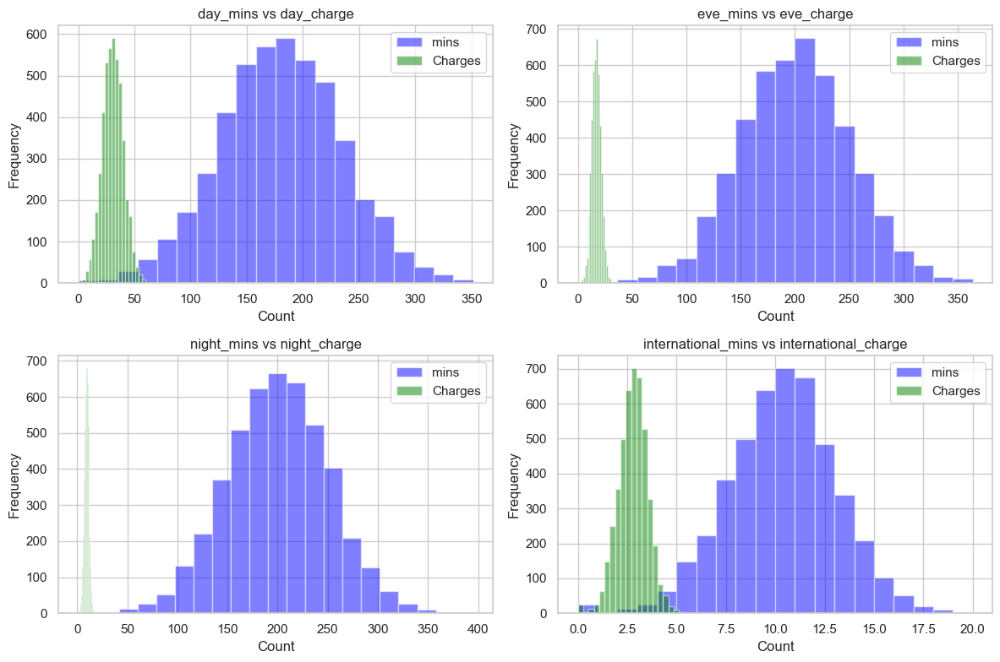

In [25]:
plt.figure(figsize=(12, 8))
mins_columns = ['day_mins', 'eve_mins', 'night_mins', 'international_mins']
charge_columns = ['day_charge', 'eve_charge', 'night_charge', 'international_charge']

for i in range(len(calls_columns)):
    plt.subplot(2, 2, i+1)
    plt.hist(churn_data[mins_columns[i]], bins=20, alpha=0.5, label='mins', color='blue')
    plt.hist(churn_data[charge_columns[i]], bins=20, alpha=0.5, label='Charges', color='green')
    plt.title(f'{mins_columns[i]} vs {charge_columns[i]}')
    plt.xlabel('Count')
    plt.ylabel('Frequency')
    plt.legend()

plt.tight_layout()
plt.show()

In [26]:
cost_per_minute_day = churn_data['day_charge'] / churn_data['day_mins']
cost_per_minute_evening = churn_data['eve_charge'] / churn_data['eve_mins']
cost_per_minute_night = churn_data['night_charge'] / churn_data['night_mins']
cost_per_minute_international = churn_data['international_charge'] / churn_data['international_mins']

average_cost_day = cost_per_minute_day.mean()
average_cost_evening = cost_per_minute_evening.mean()
average_cost_night = cost_per_minute_night.mean()
average_cost_international = cost_per_minute_international.mean()


print(f'Average Cost per Minute (Day): {average_cost_day:.2f}')
print(f'Average Cost per Minute (Evening): {average_cost_evening:.2f}')
print(f'Average Cost per Minute (Night): {average_cost_night:.2f}')
print(f'Average Cost per Minute (International): {average_cost_international:.2f}')

Average Cost per Minute (Day): 0.17
Average Cost per Minute (Evening): 0.09
Average Cost per Minute (Night): 0.05
Average Cost per Minute (International): 0.27


#### we can anylyse from this situation that these values cannot be clubbed together as they can play a significant role in the churn prediction 

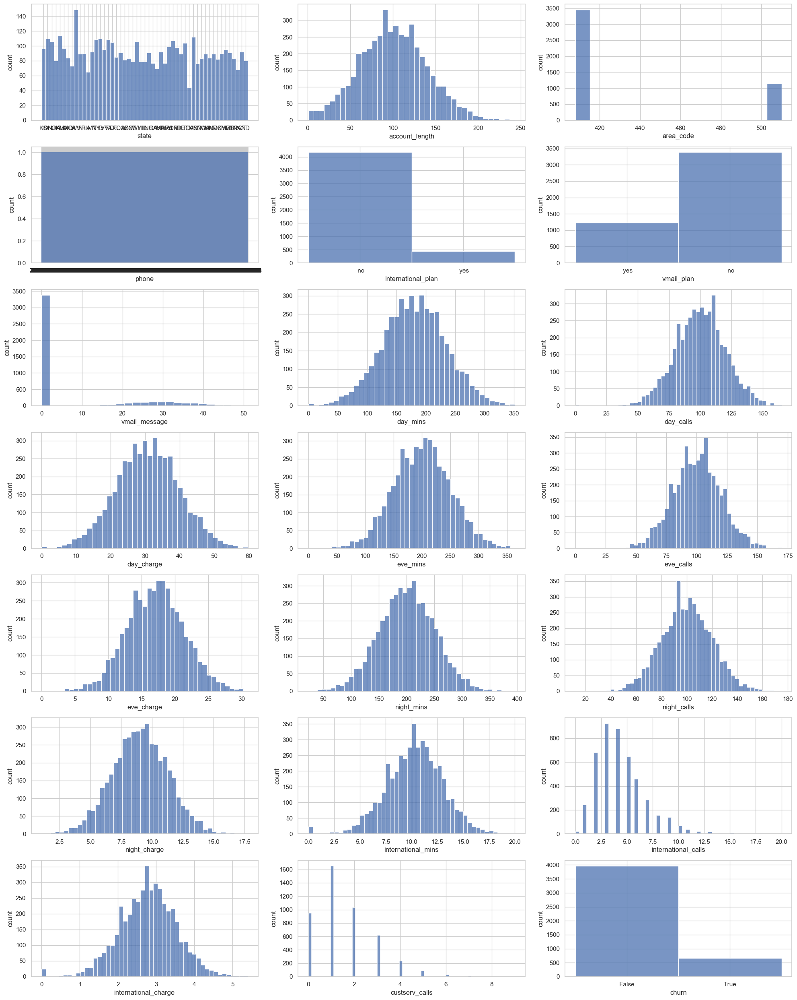

In [27]:
plt.figure(figsize=(20,25),facecolor='white')
pltno =1 

for column in churn_data:
    if pltno<=21:
        ax=plt.subplot(7,3,pltno)
        sns.histplot(churn_data[column])
        plt.xlabel(column)
        plt.ylabel('count')
    pltno+=1
plt.tight_layout()

#### almost all of them are skewed normally also can be understood as zero skewness

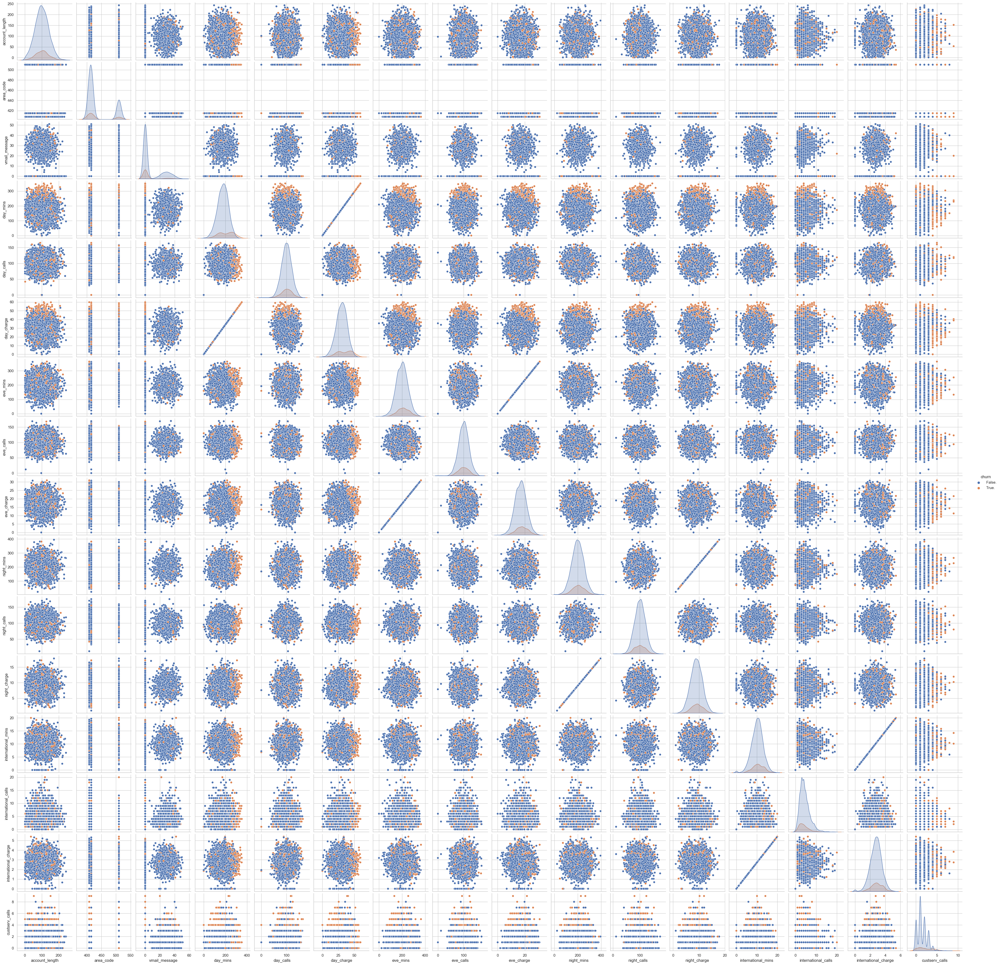

In [28]:
sns.pairplot(churn_data, hue='churn', diag_kind='kde')
plt.show()

#### it can be seen the higher the values it goes the more orange that is TRUE is witnessed indicating the high chnace of churn with more usage and spending 

#### converting categorical to nunmerical  

In [29]:
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()

In [30]:
churn_data['churn'] = lb.fit_transform(churn_data['churn'])
churn_data['international_plan'] = lb.fit_transform(churn_data['international_plan'])
churn_data['vmail_plan'] = lb.fit_transform(churn_data['vmail_plan'])
churn_data['state']=lb.fit_transform(churn_data['state'])

In [31]:
churn_data

,state,account_length,area_code,phone,international_plan,vmail_plan,vmail_message,day_mins,day_calls,day_charge,...,eve_calls,eve_charge,night_mins,night_calls,night_charge,international_mins,international_calls,international_charge,custserv_calls,churn
0,16,128,415,382-4657,0,1,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,35,107,415,371-7191,0,1,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,31,137,415,358-1921,0,0,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,35,84,408,375-9999,1,0,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,36,75,415,330-6626,1,0,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,34,57,510,345-7512,0,1,25,144.0,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.30,3,0
4613,32,177,408,343-6820,0,1,29,189.0,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,0
4614,46,67,408,338-4794,0,1,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13.0,3,3.51,1,0
4615,22,98,415,355-8388,0,1,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,0


In [32]:
state_churn = churn_data.groupby('state')['churn'].value_counts().unstack().fillna(0)

state_churn['total_count'] = state_churn[0] + state_churn[1]
state_churn = state_churn.sort_values(by='total_count', ascending=False)
state_churn

churn,0,1,total_count
state,,,
49,128,21,149
1,104,10,114
23,94,18,112
13,97,13,110
35,95,15,110
34,91,18,109
45,103,6,109
37,90,17,107
31,81,25,106


In [33]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   state                 4617 non-null   int32  
 1   account_length        4617 non-null   int16  
 2   area_code             4617 non-null   int16  
 3   phone                 4617 non-null   object 
 4   international_plan    4617 non-null   int32  
 5   vmail_plan            4617 non-null   int32  
 6   vmail_message         4617 non-null   int8   
 7   day_mins              4617 non-null   float64
 8   day_calls             4617 non-null   int16  
 9   day_charge            4617 non-null   float64
 10  eve_mins              4617 non-null   float64
 11  eve_calls             4617 non-null   int16  
 12  eve_charge            4617 non-null   float64
 13  night_mins            4617 non-null   float64
 14  night_calls           4617 non-null   int16  
 15  night_charge         

In [34]:
churn_data.account_length.unique()

array([128, 107, 137,  84,  75, 118, 121, 147, 117, 141,  65,  74, 168,
        95,  62, 161,  85,  93,  76,  73,  77, 130, 111, 132, 174,  57,
        54,  20,  49, 142, 172,  12,  72,  36,  78, 136, 149,  98, 135,
        34, 160,  64,  59, 119,  97,  52,  60,  10,  96,  87,  81,  68,
       125, 116,  38,  40,  43, 113, 126, 150, 138, 162,  90,  50,  82,
       144,  46,  70,  55, 106,  94, 155,  80, 104,  99, 120, 108, 122,
       157, 103,  63, 112,  41, 193,  61,  92, 131, 163,  91, 127, 110,
       140,  83, 145,  56, 151, 139,   6, 115, 146, 185, 148,  32,  25,
       179,  67,  19, 170, 164,  51, 208,  53, 105,  66,  86,  35,  88,
       123,  45, 100, 215,  22,  33, 114,  24, 101, 143,  48,  71, 167,
        89, 199, 166, 158, 196, 209,  16,  39, 173, 129,  44,  79,  31,
       124,  37, 159, 194, 154,  21, 133, 224,  58,  11, 109, 102, 165,
        18,  30, 176,  47, 190, 152,  26,  69, 186, 171,  28, 153, 169,
        13,  27,   3,  42, 189, 156, 134, 243,  23,   1, 205, 20

In [35]:
unique_account_lengths = churn_data['account_length'].unique()
sorted_account_lengths = sorted(unique_account_lengths)
print(sorted_account_lengths)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 199, 200, 201, 202, 204, 205, 208, 209, 210, 212, 215, 216, 217, 221, 222, 224, 225, 232, 233, 238, 243]


In [36]:
unique_area_code = churn_data['area_code'].unique()
sorted_area_code = sorted(unique_area_code)
print(sorted_area_code)

[408, 415, 510]


#####  so there are only 3 available area codes. 408, 415, 510 
so there can wo possible ways to divide the segements based on area code? or based on the account length grouping every 28 or 30 days

In [37]:
area_code_churn = churn_data.groupby('area_code')['churn'].value_counts().unstack().fillna(0)
area_code_churn

churn,0,1
area_code,,
408,996,165
415,1981,318
510,984,173


#### the categorical value of phone number do not play any significant role in retaining a service. for further analysis that column will be dropped.

In [38]:
churn_data = churn_data.drop(['phone','area_code','day_calls','eve_calls','night_calls','international_calls'], axis=1)

In [39]:
churn_data

,state,account_length,international_plan,vmail_plan,vmail_message,day_mins,day_charge,eve_mins,eve_charge,night_mins,night_charge,international_mins,international_charge,custserv_calls,churn
0,16,128,0,1,25,265.1,45.07,197.4,16.78,244.7,11.01,10.0,2.70,1,0
1,35,107,0,1,26,161.6,27.47,195.5,16.62,254.4,11.45,13.7,3.70,1,0
2,31,137,0,0,0,243.4,41.38,121.2,10.30,162.6,7.32,12.2,3.29,0,0
3,35,84,1,0,0,299.4,50.90,61.9,5.26,196.9,8.86,6.6,1.78,2,0
4,36,75,1,0,0,166.7,28.34,148.3,12.61,186.9,8.41,10.1,2.73,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,34,57,0,1,25,144.0,24.48,187.2,15.91,158.6,7.14,8.5,2.30,3,0
4613,32,177,0,1,29,189.0,32.13,303.1,25.76,163.6,7.36,15.7,4.24,3,0
4614,46,67,0,1,33,127.5,21.68,296.1,25.17,200.9,9.04,13.0,3.51,1,0
4615,22,98,0,1,23,168.9,28.71,226.3,19.24,165.5,7.45,14.3,3.86,0,0


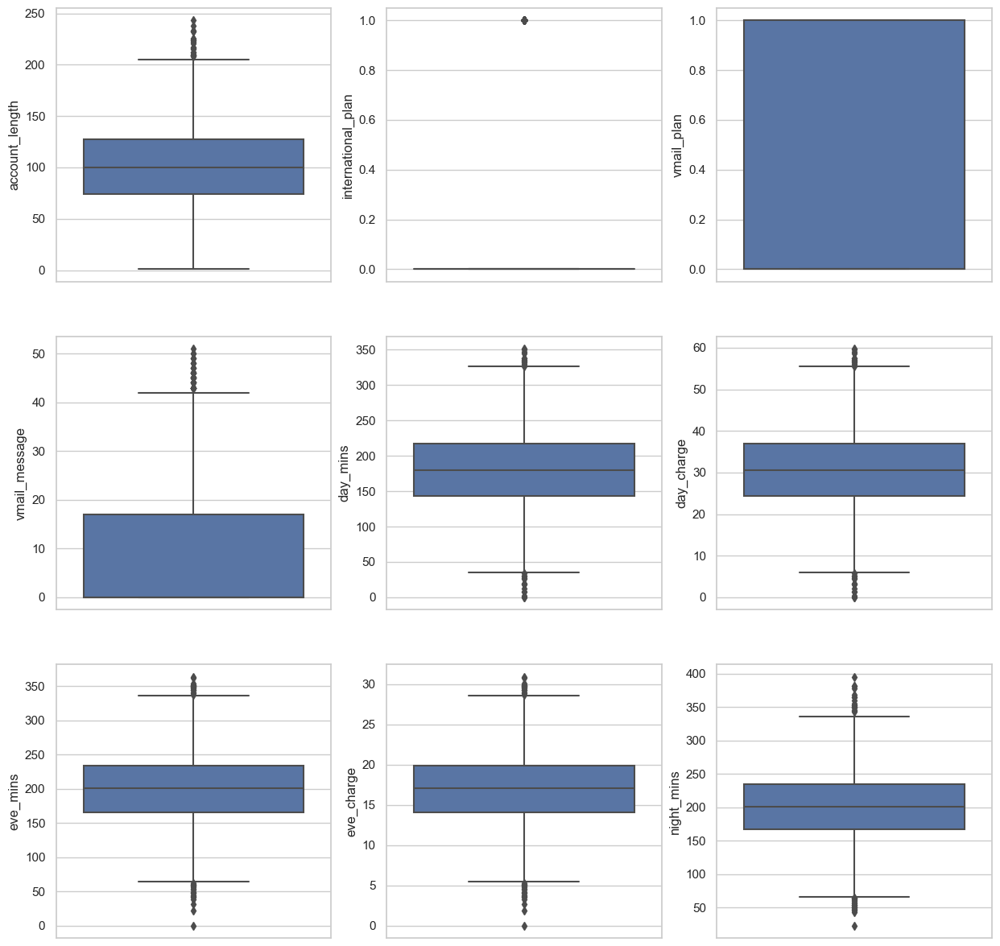

In [40]:
plt.figure(figsize=(15,15))
plt_num = 1

churn_data_bp = churn_data.columns
churn_data_bp = churn_data_bp.drop(["state", "churn"])

for column in churn_data_bp:
    if plt_num <= 9:
        plt.subplot(3,3,plt_num)
        sns.boxplot(y=churn_data[column])
    plt_num+=1
plt.show()    

#### the outliers are not in extreme cases. there fore extensive analysis can be deemed unnecessary 

In [41]:
x = churn_data.drop(['churn'], axis=1)
y = churn_data['churn']

#### using standard scaler because the data is evenly distributed and no effectivev outliers.

In [42]:
#STANDARD SCALER
from sklearn.preprocessing import StandardScaler
std = StandardScaler()

In [43]:
x

,state,account_length,international_plan,vmail_plan,vmail_message,day_mins,day_charge,eve_mins,eve_charge,night_mins,night_charge,international_mins,international_charge,custserv_calls
0,16,128,0,1,25,265.1,45.07,197.4,16.78,244.7,11.01,10.0,2.70,1
1,35,107,0,1,26,161.6,27.47,195.5,16.62,254.4,11.45,13.7,3.70,1
2,31,137,0,0,0,243.4,41.38,121.2,10.30,162.6,7.32,12.2,3.29,0
3,35,84,1,0,0,299.4,50.90,61.9,5.26,196.9,8.86,6.6,1.78,2
4,36,75,1,0,0,166.7,28.34,148.3,12.61,186.9,8.41,10.1,2.73,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,34,57,0,1,25,144.0,24.48,187.2,15.91,158.6,7.14,8.5,2.30,3
4613,32,177,0,1,29,189.0,32.13,303.1,25.76,163.6,7.36,15.7,4.24,3
4614,46,67,0,1,33,127.5,21.68,296.1,25.17,200.9,9.04,13.0,3.51,1
4615,22,98,0,1,23,168.9,28.71,226.3,19.24,165.5,7.45,14.3,3.86,0


In [44]:
x_scaled = std.fit_transform(x)
x_scaled = pd.DataFrame (x_scaled, columns = ['state','account_length','international_plan','vmail_plan','vmail_message','day_mins','day_charge','eve_mins','eve_charge','night_mins','night_charge','international_mins','international_charge', 'custserv_calls'])

In [45]:
churn_data_scaled = pd.concat([x_scaled.reset_index(drop=True), y.reset_index(drop = True)],axis=1)

In [46]:
churn_data_scaled

,state,account_length,international_plan,vmail_plan,vmail_message,day_mins,day_charge,eve_mins,eve_charge,night_mins,night_charge,international_mins,international_charge,custserv_calls,churn
0,-0.679001,0.690901,-0.327000,1.653916,1.261885,1.568293,1.568569,-0.059921,-0.059742,0.872135,0.871418,-0.101301,-0.102005,-0.433885,0
1,0.605758,0.160503,-0.327000,1.653916,1.335463,-0.349166,-0.349447,-0.097506,-0.096978,1.064069,1.064889,1.240707,1.241481,-0.433885,0
2,0.335283,0.918214,-0.327000,-0.604626,-0.577587,1.166275,1.166439,-1.567294,-1.567818,-0.752381,-0.751101,0.696649,0.690651,-1.199068,0
3,0.605758,-0.420409,3.058107,-0.604626,-0.577587,2.203741,2.203911,-2.740354,-2.740765,-0.073686,-0.073952,-1.334498,-1.338013,0.331298,0
4,0.673377,-0.647723,3.058107,-0.604626,-0.577587,-0.254682,-0.254636,-1.031207,-1.030217,-0.271556,-0.271820,-0.065031,-0.061701,1.096480,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,0.538139,-1.102350,-0.327000,1.653916,1.261885,-0.675226,-0.675291,-0.261695,-0.262215,-0.831529,-0.830248,-0.645359,-0.639400,1.096480,0
4613,0.402902,1.928496,-0.327000,1.653916,1.556200,0.158452,0.158391,2.031015,2.030153,-0.732594,-0.733513,1.966116,1.966963,1.096480,0
4614,1.349567,-0.849779,-0.327000,1.653916,1.850515,-0.980908,-0.980430,1.892543,1.892843,0.005463,0.005195,0.986813,0.986218,-0.433885,0
4615,-0.273288,-0.066811,-0.327000,1.653916,1.114727,-0.213925,-0.214314,0.511773,0.512768,-0.694999,-0.693939,1.458330,1.456438,-1.199068,0


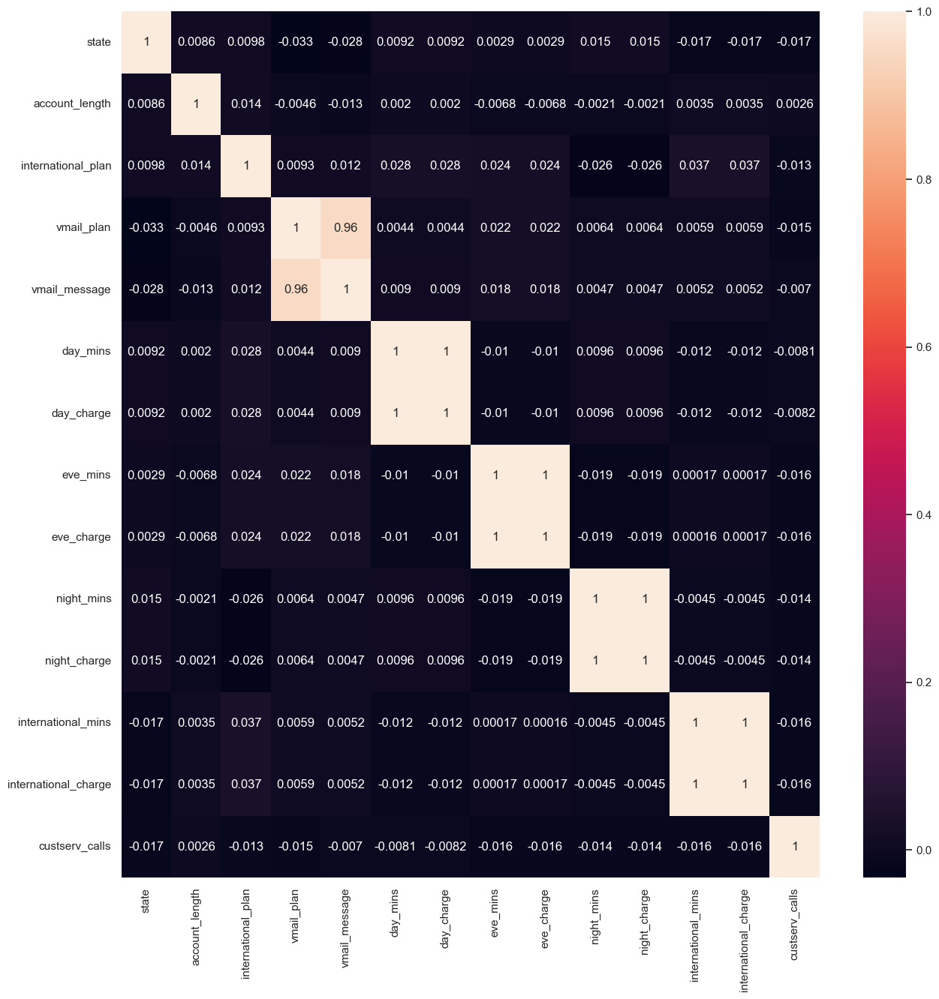

In [47]:
# 1. CORRELATION
plt.figure(figsize=(15,15))
sns.heatmap(x_scaled.corr(), annot=True)
plt.show()

##### here the highly correlated features except 4 features.

In [48]:
# 2. Variance threshold
from sklearn.model_selection import train_test_split as tts
from sklearn.feature_selection import VarianceThreshold as vt

In [49]:
x_train_vt, x_test_vt, y_train_vt, y_test_vt = tts(x_scaled, y , test_size = 0.2, random_state = 42)
v_t = vt(threshold = 0.1)
v_t.fit(x_train_vt)
v_t.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True])

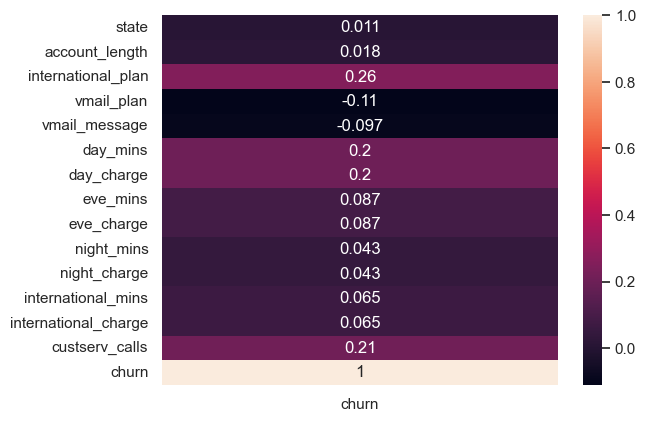

In [50]:
sns.heatmap(churn_data_scaled.corr()[["churn"]], annot=True)
plt.show()

#### in variance threshold feature reduction method there is no corelation to the churn data. 

In [51]:
# 3. information gain
from sklearn.feature_selection import mutual_info_classif
information_gain = mutual_info_classif(x_scaled, y)

In [52]:
important_feature = pd.DataFrame({'Feature':x_scaled.columns, 'Information Gain' : information_gain})
important_feature = important_feature.sort_values(by= 'Information Gain', ascending=False)
important_feature

,Feature,Information Gain
6,day_charge,0.055507
5,day_mins,0.054797
13,custserv_calls,0.031437
2,international_plan,0.023073
4,vmail_message,0.013938
12,international_charge,0.010644
11,international_mins,0.010602
3,vmail_plan,0.004507
10,night_charge,0.003542
0,state,0.001796


#### in Information gain there are three features that are less inclusive for the output of the model. account_length, eve_mins, night_mins.

In [53]:
# 4. chi square test
from sklearn.feature_selection import SelectKBest, chi2

In [54]:
churn_chi = SelectKBest(chi2, k=11)

In [55]:
churn_chi_bf = churn_chi.fit_transform(x,y)

In [56]:
churn_chi_bf_indices = churn_chi.get_support(indices = True)
#print(x.columns[[churn_chi_bf_indices]])

In [57]:
x.columns.to_numpy()[churn_chi_bf_indices]

array(['account_length', 'international_plan', 'vmail_plan',
       'vmail_message', 'day_mins', 'day_charge', 'eve_mins',
       'eve_charge', 'night_mins', 'international_mins', 'custserv_calls'],
      dtype=object)

#### Comparing the four above feature elimination methods to reduce the features for better modelling. all have different outcomes of decisions. considering correlation and information gain "eve_mins" and "night_mins" will be eliminated

In [58]:
churn_data_scaled = churn_data_scaled.drop(['eve_mins','night_mins'], axis=1)

In [59]:
churn_data_scaled

,state,account_length,international_plan,vmail_plan,vmail_message,day_mins,day_charge,eve_charge,night_charge,international_mins,international_charge,custserv_calls,churn
0,-0.679001,0.690901,-0.327000,1.653916,1.261885,1.568293,1.568569,-0.059742,0.871418,-0.101301,-0.102005,-0.433885,0
1,0.605758,0.160503,-0.327000,1.653916,1.335463,-0.349166,-0.349447,-0.096978,1.064889,1.240707,1.241481,-0.433885,0
2,0.335283,0.918214,-0.327000,-0.604626,-0.577587,1.166275,1.166439,-1.567818,-0.751101,0.696649,0.690651,-1.199068,0
3,0.605758,-0.420409,3.058107,-0.604626,-0.577587,2.203741,2.203911,-2.740765,-0.073952,-1.334498,-1.338013,0.331298,0
4,0.673377,-0.647723,3.058107,-0.604626,-0.577587,-0.254682,-0.254636,-1.030217,-0.271820,-0.065031,-0.061701,1.096480,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,0.538139,-1.102350,-0.327000,1.653916,1.261885,-0.675226,-0.675291,-0.262215,-0.830248,-0.645359,-0.639400,1.096480,0
4613,0.402902,1.928496,-0.327000,1.653916,1.556200,0.158452,0.158391,2.030153,-0.733513,1.966116,1.966963,1.096480,0
4614,1.349567,-0.849779,-0.327000,1.653916,1.850515,-0.980908,-0.980430,1.892843,0.005195,0.986813,0.986218,-0.433885,0
4615,-0.273288,-0.066811,-0.327000,1.653916,1.114727,-0.213925,-0.214314,0.512768,-0.693939,1.458330,1.456438,-1.199068,0


In [60]:
#splitting the data
x_train, x_test, y_train, y_test = tts(x_scaled, y, test_size = 0.2, random_state=42)

In [61]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [62]:
pip install --upgrade imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [63]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()

In [64]:
xsmote, ysmote = smote.fit_resample(x_train, y_train)

In [65]:
ysmote.value_counts()

churn
1    3162
0    3162
Name: count, dtype: int64

### Model Creation

### 1. Support Vector Machine

In [66]:
from sklearn.svm import SVC
svm = SVC()

In [67]:
svm.fit(xsmote, ysmote)

SVC()

In [68]:
ypred = svm.predict(x_test)

In [69]:
from sklearn.metrics import classification_report, f1_score, confusion_matrix, accuracy_score

In [70]:
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

           0       0.96      0.90      0.93       799
           1       0.56      0.78      0.65       125

    accuracy                           0.89       924
   macro avg       0.76      0.84      0.79       924
weighted avg       0.91      0.89      0.90       924



#### hyperparameter tuning

In [71]:
from sklearn.model_selection import GridSearchCV

In [72]:
params_grid = {'C':[0.1,0.01,1],
              'gamma':[0.01,0.001,0.001],
              'random_state':(list(range(0,25)))}

In [73]:
model = SVC()
grid = GridSearchCV(svm, params_grid, refit =True, verbose = 2,
                   scoring = 'f1', cv=5)

In [74]:
grid.fit(x,y)

Fitting 5 folds for each of 225 candidates, totalling 1125 fits
[CV] END ..................C=0.1, gamma=0.01, random_state=0; total time=   1.2s
[CV] END ..................C=0.1, gamma=0.01, random_state=0; total time=   1.2s
[CV] END ..................C=0.1, gamma=0.01, random_state=0; total time=   1.1s
[CV] END ..................C=0.1, gamma=0.01, random_state=0; total time=   1.2s
[CV] END ..................C=0.1, gamma=0.01, random_state=0; total time=   1.1s
[CV] END ..................C=0.1, gamma=0.01, random_state=1; total time=   1.1s
[CV] END ..................C=0.1, gamma=0.01, random_state=1; total time=   1.2s
[CV] END ..................C=0.1, gamma=0.01, random_state=1; total time=   1.1s
[CV] END ..................C=0.1, gamma=0.01, random_state=1; total time=   1.1s
[CV] END ..................C=0.1, gamma=0.01, random_state=1; total time=   1.1s
[CV] END ..................C=0.1, gamma=0.01, random_state=2; total time=   1.1s
[CV] END ..................C=0.1, gamma=0.01,

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 0.01, 1], 'gamma': [0.01, 0.001, 0.001],
                         'random_state': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                          12, 13, 14, 15, 16, 17, 18, 19, 20,
                                          21, 22, 23, 24]},
             scoring='f1', verbose=2)

In [75]:
grid.best_params_

{'C': 1, 'gamma': 0.001, 'random_state': 0}

In [76]:
re_model =SVC(C = 1, gamma = 0.001, random_state=0)
re_model.fit(xsmote, ysmote)

SVC(C=1, gamma=0.001, random_state=0)

In [77]:
ypred = re_model.predict(x_test)

In [78]:
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

           0       0.96      0.73      0.83       799
           1       0.32      0.80      0.46       125

    accuracy                           0.74       924
   macro avg       0.64      0.77      0.64       924
weighted avg       0.87      0.74      0.78       924



### 2. Log. Reg 

In [79]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

In [80]:
lr.fit(xsmote, ysmote)

LogisticRegression()

In [81]:
ypred = lr.predict(x_test)

In [82]:
y_pred_prob = lr.predict_proba(x_test)
y_pred_prob

array([[0.44315519, 0.55684481],
       [0.65663737, 0.34336263],
       [0.78881332, 0.21118668],
       ...,
       [0.52370052, 0.47629948],
       [0.1724831 , 0.8275169 ],
       [0.94443073, 0.05556927]])

In [83]:
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.96      0.74      0.83       799
           1       0.32      0.79      0.46       125

    accuracy                           0.74       924
   macro avg       0.64      0.76      0.64       924
weighted avg       0.87      0.74      0.78       924



### 3. Decision tree

In [84]:
from sklearn.tree import DecisionTreeClassifier

In [85]:
dt = DecisionTreeClassifier()

In [86]:
dt.fit(xsmote, ysmote)

DecisionTreeClassifier()

In [87]:
ypred = dt.predict(x_test)

In [88]:
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.95      0.89      0.92       799
           1       0.51      0.70      0.59       125

    accuracy                           0.87       924
   macro avg       0.73      0.80      0.75       924
weighted avg       0.89      0.87      0.88       924



#### hyperparameter tuning

In [89]:
from sklearn.model_selection import GridSearchCV

In [90]:
params_grid = {'criterion':['gini','entropy'],
              'splitter':['best','random'],
              'max_depth':(list(range(1,10))),
              'min_samples_split':[2,3,4,5],
              'min_samples_leaf':(list(range(1,10)))}

In [91]:
d_tree_cv = GridSearchCV(dt, params_grid, refit = True, verbose =2, 
                         scoring='f1', cv= 3, n_jobs = -1)

In [92]:
d_tree_cv.fit(xsmote, ysmote)

Fitting 3 folds for each of 1296 candidates, totalling 3888 fits


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9],
                         'min_samples_split': [2, 3, 4, 5],
                         'splitter': ['best', 'random']},
             scoring='f1', verbose=2)

In [93]:
d_tree_cv.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

In [94]:
hyp_dt = DecisionTreeClassifier( criterion = 'entropy',
                               max_depth=9,
                               min_samples_leaf=3,
                               min_samples_split =3,
                               splitter = 'best', random_state=42)
hyp_dt.fit(xsmote, ysmote)
y_new_pred = hyp_dt.predict(x_test)
print(classification_report(y_test,y_new_pred))

              precision    recall  f1-score   support

           0       0.95      0.90      0.92       799
           1       0.52      0.72      0.61       125

    accuracy                           0.87       924
   macro avg       0.74      0.81      0.77       924
weighted avg       0.90      0.87      0.88       924



### 4. random forest

In [95]:
from sklearn.ensemble import RandomForestClassifier

In [96]:
churn_rf = RandomForestClassifier(n_estimators = 100)

In [97]:
churn_rf.fit(xsmote, ysmote)

RandomForestClassifier()

In [98]:
churn_rf_pred = churn_rf.predict(x_test)

In [99]:
print(classification_report(y_test, churn_rf_pred))

              precision    recall  f1-score   support

           0       0.96      0.95      0.95       799
           1       0.69      0.76      0.72       125

    accuracy                           0.92       924
   macro avg       0.83      0.85      0.84       924
weighted avg       0.92      0.92      0.92       924



### 5. Naive bayes

In [100]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()

In [101]:
nb.fit(xsmote, ysmote)

GaussianNB()

In [102]:
y_pred = nb.predict(x_test)

In [103]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.79      0.87       799
           1       0.37      0.79      0.50       125

    accuracy                           0.79       924
   macro avg       0.66      0.79      0.68       924
weighted avg       0.88      0.79      0.82       924



### 6. ANN

In [105]:
pip install tensorflow

  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/27/7e/9699c0ebd2bf124df8446bc4767390c023f7bb2d072b7ff92ae7f3fc1379/tensorflow-2.14.0-cp39-cp39-win_amd64.whl.metadata
  Obtaining dependency information for tensorflow-intel==2.14.0 from https://files.pythonhosted.org/packages/29/ab/79512973474b56a7f9efef2cab0ec2f803759e90e1b65ff0383d2b0788c4/tensorflow_intel-2.14.0-cp39-cp39-win_amd64.whl.metadata
  Obtaining dependency information for absl-py>=1.0.0 from https://files.pythonhosted.org/packages/01/e4/dc0a1dcc4e74e08d7abedab278c795eef54a224363bb18f5692f416d834f/absl_py-2.0.0-py3-none-any.whl.metadata
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Obtaining dependency information for flatbuffers>=23.5.26 from https://files.pythonhosted.org/packages/6f/12/d5c79ee252793ffe845d58a913197bfa02ae9a0b5c9bc3dc4b58d477b9e7/flatbuffers-23.5.26-py2.py3-none-any.whl.metadata
  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
  Obta

In [107]:
import tensorflow as tf

In [108]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

model = Sequential()
model.add(Dense(64, input_dim=x_train.shape[1], activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [109]:
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


In [110]:
model.fit(xsmote, ysmote, epochs=20, batch_size=32, validation_data=(x_test, y_test))

Epoch 1/20
198/198 [==============================] - 2s 5ms/step - loss: 0.4579 - accuracy: 0.8151 - val_loss: 0.4453 - val_accuracy: 0.7998
Epoch 2/20
198/198 [==============================] - 1s 3ms/step - loss: 0.3471 - accuracy: 0.8725 - val_loss: 0.3737 - val_accuracy: 0.8442
Epoch 3/20
198/198 [==============================] - 1s 3ms/step - loss: 0.3178 - accuracy: 0.8824 - val_loss: 0.3201 - val_accuracy: 0.8701
Epoch 4/20
198/198 [==============================] - 1s 3ms/step - loss: 0.2986 - accuracy: 0.8863 - val_loss: 0.3385 - val_accuracy: 0.8604
Epoch 5/20
198/198 [==============================] - 1s 4ms/step - loss: 0.2822 - accuracy: 0.8910 - val_loss: 0.2952 - val_accuracy: 0.8810
Epoch 6/20
198/198 [==============================] - 1s 3ms/step - loss: 0.2683 - accuracy: 0.8955 - val_loss: 0.3239 - val_accuracy: 0.8647
Epoch 7/20
198/198 [==============================] - 1s 4ms/step - loss: 0.2569 - accuracy: 0.9015 - val_loss: 0.3115 - val_accuracy: 0.8723
Epoch 

In [111]:
y_pred = model.predict(x_test)

29/29 [==============================] - 0s 2ms/step


In [112]:
accuracy = model.evaluate(x_test, y_test)

29/29 [==============================] - 0s 2ms/step - loss: 0.3033 - accuracy: 0.8831


### Model Comparision

In [113]:
model_names = ["Support Vector Machine", "Logistic Regression", "Decision Tree", "Random Forest", 
               "Naive Bayes", "Artificial Neural Net"]
model_functions = [svm.predict, lr.predict, dt.predict, churn_rf.predict, nb.predict, model.predict]

metrics_dfs = []

for name, predict_fn in zip(model_names, model_functions):
    raw_predictions = predict_fn(x_test)
    binary_predictions = (raw_predictions > 0.5).astype(int)
    
    report = classification_report(y_test, binary_predictions, output_dict=True)
    precision = report["1"]["precision"]
    recall = report["1"]["recall"]
    f1 = report["1"]["f1-score"]
    accuracy = accuracy_score(y_test, binary_predictions)
    
    model_metrics_df = pd.DataFrame({"Model": [name], "Precision": [precision], "Recall": [recall], 
                                     "F1-Score": [f1], "Accuracy": [accuracy]})
    metrics_dfs.append(model_metrics_df)

metrics_df = pd.concat(metrics_dfs, ignore_index=True)

print(metrics_df)


29/29 [==============================] - 0s 3ms/step
                    Model  Precision  Recall  F1-Score  Accuracy
0  Support Vector Machine   0.560000   0.784  0.653333  0.887446
1     Logistic Regression   0.320388   0.792  0.456221  0.744589
2           Decision Tree   0.508772   0.696  0.587838  0.867965
3           Random Forest   0.688406   0.760  0.722433  0.920996
4             Naive Bayes   0.368030   0.792  0.502538  0.787879
5   Artificial Neural Net   0.546961   0.792  0.647059  0.883117


#### Random forest model even offeres the better f1 score for the churn 0,1 data

# Conclusion

<justify>Based on various metrics and models by comparing and evaluating all, almost all the models have performed better. The top three would be:</justify>

1. Random Forest
2. Decision Tree with Hyperparameter tuning.
3. Support Vector Machine

<justify>Keeping in mind that achieving much better results is possible considering how the data was collected and how little there is to do with the cleaning process. The well-served data has contributed significantly to the improved performance of these models.</justify>


## Challenges

1. The number of people who opt out are less and it causes a huge imbalance in the churn data, we use smote to level it.
2. Feature selection, as the data is well cleaned and proper, it was hard to eliminate even the two features even after careful consideration.
3. Grid.fit to find the best fit, had to be aware of the number of iterations as the computaional power was more and taking a long time.